In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/aniruddhachoudhury/Red-Wine-Quality/master/winequality-red.csv")
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
pf = ProfileReport(df)
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analysis:

In citric acide column, we have 8.3% zeros values, so we may have to handle it using imputation and then after imputation we may try to observe the effect on the citric acid column, if it is becoming normally distributed or not.

Zeros values may be removed, replaced or kept as it is...it all depends on the importance of the effect of particular column on the target column. In such case, we will have to connect with the domain expert.

Sir is checking only for zeros and missing values in all of the columns.

If we have duplicate rows, we again will have to handle it by dropping them. Duplicate rows will try to give similar kind of loss that we have already achieved and based on that loss, it wil try to adjust itself,,,,overall it will increase computational time and complexity.

NOTE:

1. 
Decision trees do not always handle unbalanced data well.
Logistic/Linear to nahi hi handle kar paata hai...usme jaroori hai imbalancing ko handle karna

If there is relatively obvious particular partition of our sample space that contains a high-proportion of minority class instances, decision trees can probably find it but that is far from a certainty. For example, if the minority class is strongly associated with multiple features interacting with each other, it is rather demanding for a tree to recognise the pattern; even if it does, it will probably be a rather deep and unstable tree that will be prone to over-fitting; pruning the tree will not immediately solve the problem because it will directly affect the ability of the tree to utilise those interactions.

Generalisations of decision tree algorithms as random forests and gradient boosting machines offer a much better alternative in terms of stability without sacrificing any performance. Similarly using a GAM with an interacting spline can also provide another potentially viable alternative.

2. 
Decision trees implementations normally use Gini index or Entropy for finding splits. These are functions that are maximized when the classes in a node are perfectly balanced - and therefore reward splits that move away from this balance. This means that the splits are always done assuming that the classes distribution is 1/K (or 50-50 in the binary case), and this is particularly clear when classes are VERY unbalanced. In those cases, since classification is done by majority voting, most of the leaf nodes will contain majority class elements and the performance will be sub-optimal.

There are a number of papers that discuss this issue, but I really suggest reading Using Random Forest to learn Imbalanced Data, that proposes the use of Weighted Gini (or Entropy) to take into account the class distribution, or using a mixture of Under and Over sampling of the classes when bagging decision trees.

Indeed, standard trees are mathematically not constructed to deal particularly well with unbalanced data, and some adjustments are needed (to the voting, splitting, or sampling) - which is also why many implementations allow the use of class weights.

 #### Let us segregate x and y

In [4]:
x = df.drop(columns="quality")
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [5]:
y = df[["quality"]]
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
1594,5
1595,6
1596,6
1597,5


#### Let us go with the raw data as we have without doing some sort of operation on it.
#### In the later stage, we wiil compare both models

In [6]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .40 , random_state = 500)

In [7]:
dt_model  = DecisionTreeClassifier()
dt_model #decision tree model

DecisionTreeClassifier()

In [8]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [9]:
dt_model.predict(x_test)

array([7, 5, 5, 7, 5, 6, 5, 6, 7, 6, 6, 5, 6, 6, 5, 5, 7, 6, 6, 6, 5, 5,
       6, 6, 6, 5, 7, 6, 7, 5, 5, 6, 6, 5, 5, 5, 6, 8, 5, 6, 5, 7, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6,
       7, 5, 6, 5, 6, 6, 5, 7, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 7, 5, 5, 5,
       7, 6, 6, 4, 7, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6, 5, 6, 7, 5, 5, 6, 6,
       5, 6, 5, 5, 6, 6, 5, 7, 5, 6, 6, 5, 6, 4, 5, 5, 6, 5, 6, 7, 6, 5,
       5, 6, 5, 6, 7, 6, 6, 6, 6, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 6, 6, 5,
       5, 5, 5, 7, 6, 4, 6, 5, 5, 6, 6, 7, 6, 6, 7, 6, 5, 5, 6, 5, 6, 5,
       4, 6, 6, 6, 6, 5, 5, 7, 6, 5, 5, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5,
       6, 5, 7, 5, 6, 6, 5, 5, 7, 5, 5, 7, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6,
       6, 5, 6, 6, 7, 6, 5, 6, 5, 6, 5, 7, 6, 7, 7, 5, 5, 7, 6, 5, 6, 6,
       6, 6, 5, 6, 5, 7, 6, 5, 6, 5, 8, 5, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5,
       7, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 7, 7, 8, 5, 6, 6,
       7, 5, 5, 6, 6, 5, 6, 6, 5, 6, 5, 5, 7, 7, 5,

In [10]:
dt_model.score(x_test,y_test)

0.553125

#### By default, criterion of making trees is GINI indices,,,,now let us try to build the tree with ENTROPY criterion

In [11]:
dt_model_entropy = DecisionTreeClassifier(criterion="entropy")

In [12]:
dt_model_entropy.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [13]:
dt_model_entropy.score(x_test,y_test)

0.571875

In [14]:
outfile = open('dt_model_entropy_meta.dot','w')
tree.export_graphviz(dt_model_entropy,out_file=outfile , feature_names=x.columns)
# export_graphviz is a mtd to generate all the meta infos for the model built

# decision tree class(after 1 hr class) starts from here

In [15]:
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline

[Text(606.7859191568837, 1058.5894736842106, 'X[10] <= 10.55\ngini = 0.638\nsamples = 959\nvalue = [7, 30, 407, 392, 111, 12]'),
 Text(405.1008537886873, 1001.3684210526317, 'X[6] <= 95.5\ngini = 0.544\nsamples = 598\nvalue = [5, 21, 345, 208, 17, 2]'),
 Text(218.25720384204908, 944.1473684210526, 'X[9] <= 0.525\ngini = 0.567\nsamples = 530\nvalue = [5, 21, 283, 202, 17, 2]'),
 Text(26.87273212379936, 886.9263157894737, 'X[7] <= 0.994\ngini = 0.429\nsamples = 102\nvalue = [1, 11, 75, 14, 1, 0]'),
 Text(22.108591248665952, 829.7052631578947, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(31.636872998932763, 829.7052631578947, 'X[10] <= 9.15\ngini = 0.399\nsamples = 99\nvalue = [1, 8, 75, 14, 1, 0]'),
 Text(9.528281750266808, 772.4842105263158, 'X[2] <= 0.245\ngini = 0.611\nsamples = 6\nvalue = [0, 3, 1, 2, 0, 0]'),
 Text(4.764140875133404, 715.2631578947369, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(14.292422625400214, 715.2631578947369, 'X[7] <= 0.998

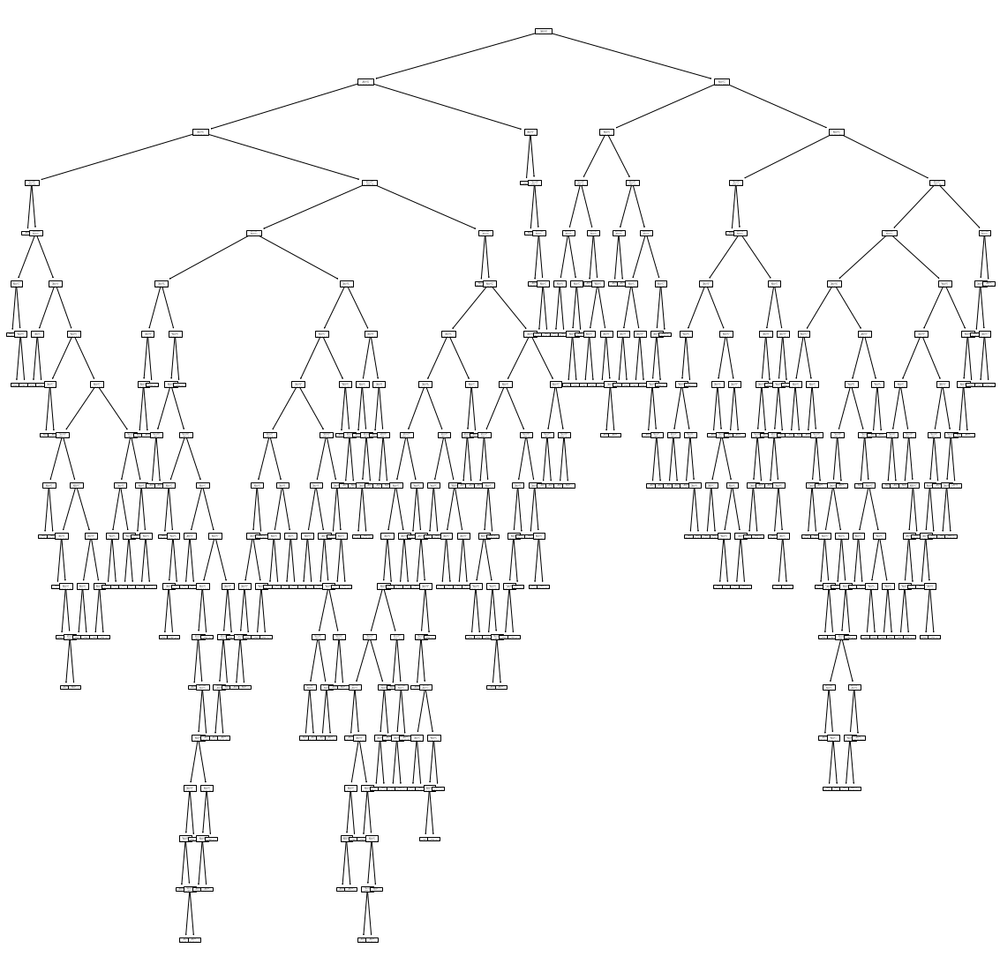

In [16]:
plt.figure(figsize = (20,20))
tree.plot_tree(dt_model)

[Text(182.03577574706512, 211.7178947368421, 'X[10] <= 10.55\ngini = 0.638\nsamples = 959\nvalue = [7, 30, 407, 392, 111, 12]'),
 Text(121.5302561366062, 200.2736842105263, 'X[6] <= 95.5\ngini = 0.544\nsamples = 598\nvalue = [5, 21, 345, 208, 17, 2]'),
 Text(65.47716115261473, 188.82947368421054, 'X[9] <= 0.525\ngini = 0.567\nsamples = 530\nvalue = [5, 21, 283, 202, 17, 2]'),
 Text(8.061819637139807, 177.38526315789474, 'X[7] <= 0.994\ngini = 0.429\nsamples = 102\nvalue = [1, 11, 75, 14, 1, 0]'),
 Text(6.632577374599787, 165.94105263157894, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(9.49106189967983, 165.94105263157894, 'X[10] <= 9.15\ngini = 0.399\nsamples = 99\nvalue = [1, 8, 75, 14, 1, 0]'),
 Text(2.858484525080043, 154.49684210526317, 'X[2] <= 0.245\ngini = 0.611\nsamples = 6\nvalue = [0, 3, 1, 2, 0, 0]'),
 Text(1.4292422625400214, 143.05263157894737, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(4.287726787620064, 143.05263157894737, 'X[7] <= 0.9

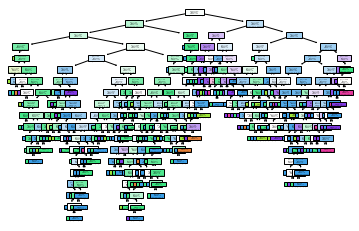

In [17]:
tree.plot_tree(dt_model, filled=True)

#### we are not able to see clear image of the tree because of a huge ammount of datasets, so let us reduce our dataset size in order to just see the tree and understand the different terms denoted on the tree

In [18]:
df1 = df.head(30)

In [19]:
x1 = df1.drop(columns="quality")

In [20]:
y1 = df1.quality

In [21]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(186.0, 815.4000000000001, 'X[10] <= 10.15\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(372.0, 453.0, 'X[6] <= 13.5\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(744.0, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(930.

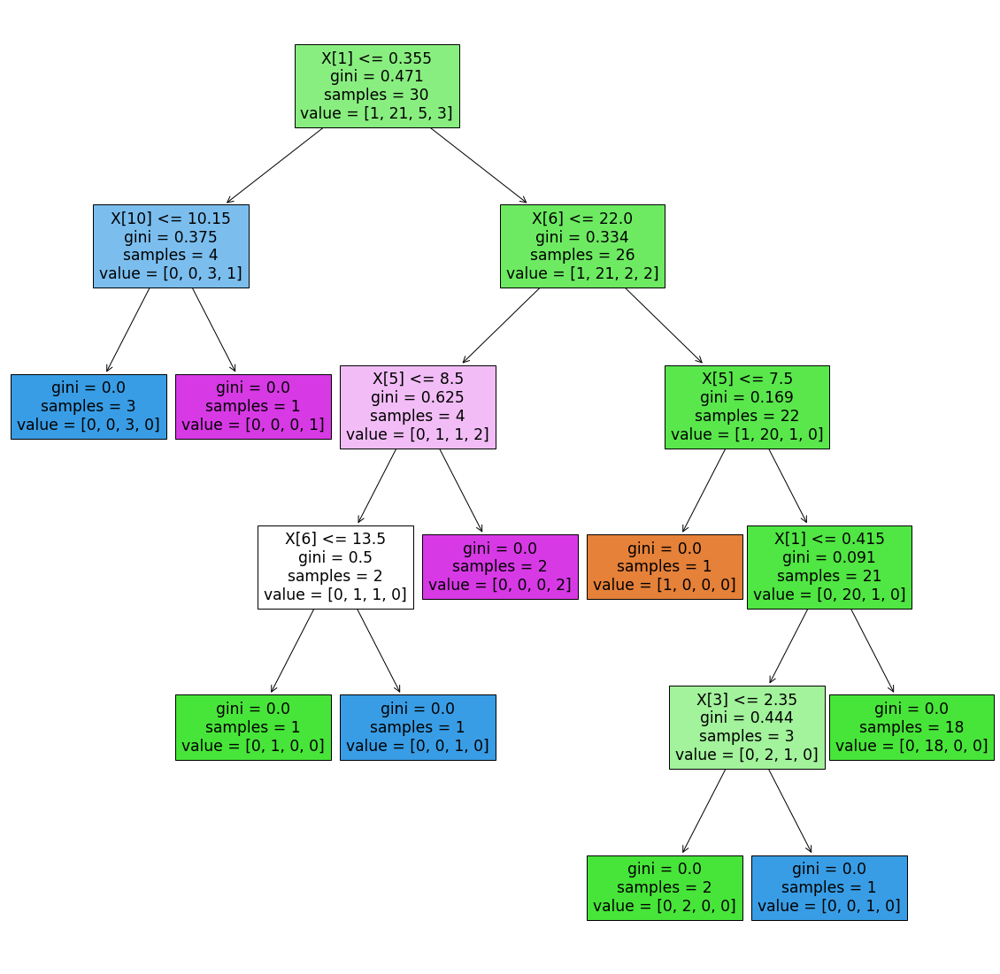

In [22]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True)

In [23]:
set(y1) 

# these are the different quality of wines(classes) present in first 30 records that we have selected

{4, 5, 6, 7}

1st value is representing on top of which column, splitting has been done

2nd value is representing gini for the particular column

3rd value is representing the number of samples at every nodes

4th value is representing number of samples in respective classes

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 5'),
 Text(186.0, 815.4000000000001, 'X[10] <= 10.15\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]\nclass = 6'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]\nclass = 6'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 5'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 7'),
 Text(372.0, 453.0, 'X[6] <= 13.5\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 5'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples =

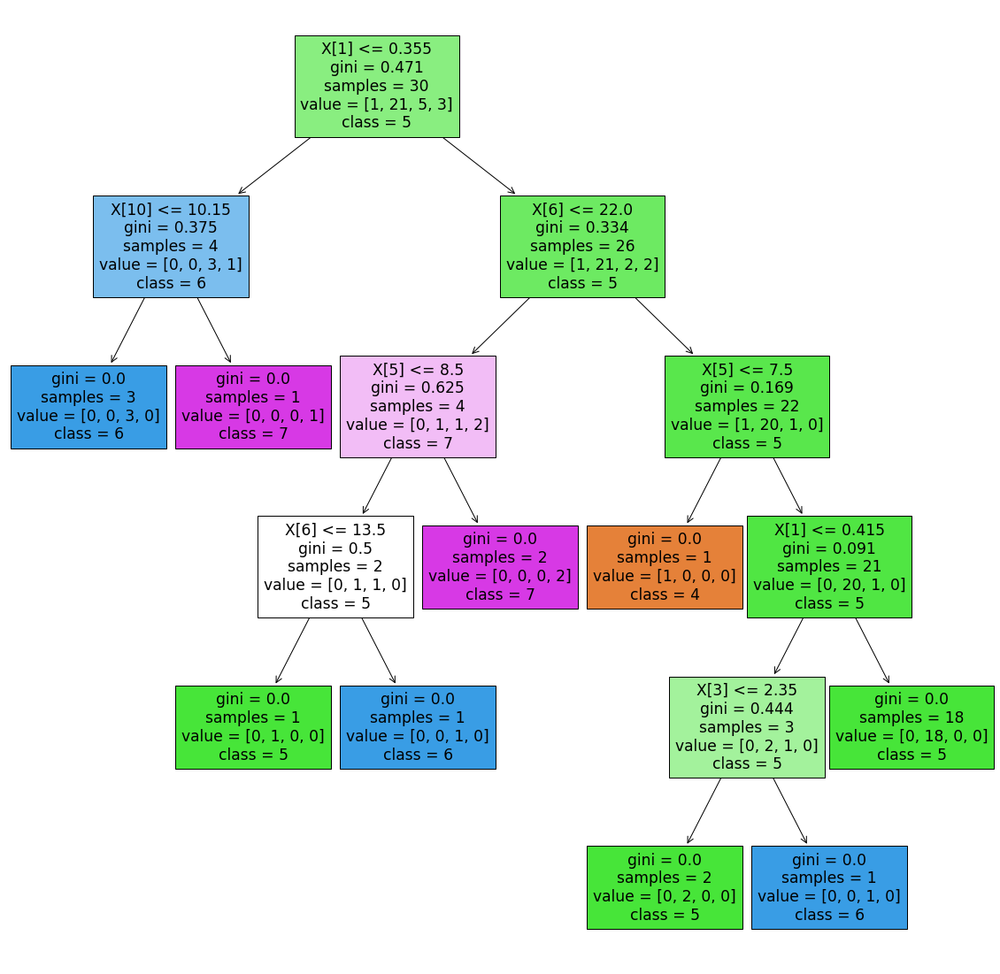

In [24]:
# Trying to see class_names in the tree

class_list_str = [str(i) for i in set(y1)]
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names= class_list_str)

In [25]:
# trying to save this tree
plt.savefig('dt_model_1')

<Figure size 432x288 with 0 Axes>

In [26]:
##### In the above tree, we can see that in the level number 4 from top, in the right hand side, 
##### we have only 1 record from class 6, but 20 records from class 5
##### so we can say that we can be able to reduce complexity of the tree if we prun from that node itself-- tjis is post pruning
##### we may have to compromise a little bit with the accuracy of the model...but still its an added advantage

In [27]:
dt_model1.score(x1,y1)

1.0

In [28]:
dt_model1.score(x_test,y_test)

0.459375

In [29]:
##  So we can say that our model is overfitted
## so our next goal is to bring this difference closer
## now we can try to perform some sort of tuning operations and build this tree and see how we can do post prunning

In [30]:
path = dt_model1.cost_complexity_pruning_path(x1,y1) # argument is given that data which was our training data
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [31]:
# by default ccp_alpha = 0 ___ it is a parameter used for minimal cost complexity prunning
### the subtree with the largest cost complexity that is smaller than ccp_alpha will be choosen
### ccp_alpha = 0 --- it will keep creating branches till possible...no prunning
### i can observe that jaise jaise ccp_alpha values badh rahi hai waise waise impurities badh rahi hai

In [32]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path["ccp_alphas"]# extracting ccp_alphas from the dictionary output of the path
ccp_alpha = path.ccp_alphas # 2nd method

In [33]:
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [34]:
#let us try to observe at what ccp_alpha value we have minimal diff between scores of train and test dataset

In [35]:
#train_score = dt_model1.score(x1,y1)

dt_model2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [36]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [37]:
### jitna ccp_alpha ka values tha i.e. 8 utna models banaye hai humlog....
### now the model which will be less overfitted model sud be selected
### jo ccp_alpha value (threshold) humlog select karenge,,,
### agar usse jayaade kisi branch ka ccp_alpha jyadde rahega to waha se tree prunning hone lagega
### grid search se v best possible ccp_alpha can be found out
### let us try to do some plot operations based on ccp_alpha vs train and test accuracy
### and we will slect that ccp_alpha where train and test score will almost be similar

In [38]:
### let us find out training accuracy

In [39]:
[model.score(x1,y1) for model in dt_model2]

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [40]:
train_score = [model.score(x1,y1) for model in dt_model2]

In [41]:
test_score = [model.score(x_test,y_test) for model in dt_model2]
test_score

[0.44375, 0.4203125, 0.4140625, 0.4125, 0.4, 0.415625, 0.459375, 0.428125]

In [42]:
### now we are supposed to plot a graph to do the required observation

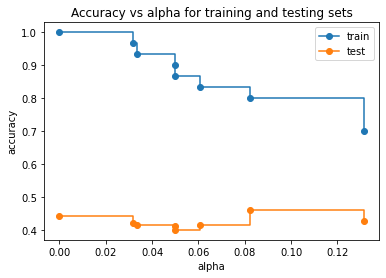

In [43]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [44]:
# we are not able to see very less difference between testing and training accuracy,
# bcoz we have trained only on 30 datasets

In [45]:
#let us try to train on 500 datasets

In [46]:
df1 = df.head(500)

In [47]:
x1 = df1.drop(columns="quality")

In [48]:
y1 = df1.quality

In [49]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(513.7688905810684, 1055.2235294117647, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(325.67432052483593, 991.2705882352941, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(205.7853795688847, 927.3176470588236, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(93.61012183692596, 863.364705882353, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(33.46954076850984, 799.4117647058824, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(25.10215557638238, 735.4588235294118, 'X[7] <= 0.998\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(16.73477038425492, 671.5058823529412, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(33.46954076850984, 671.5058823529412, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(41.836925960637295, 735.4588235294118, 'gini = 0.0\nsamples = 9\nvalue

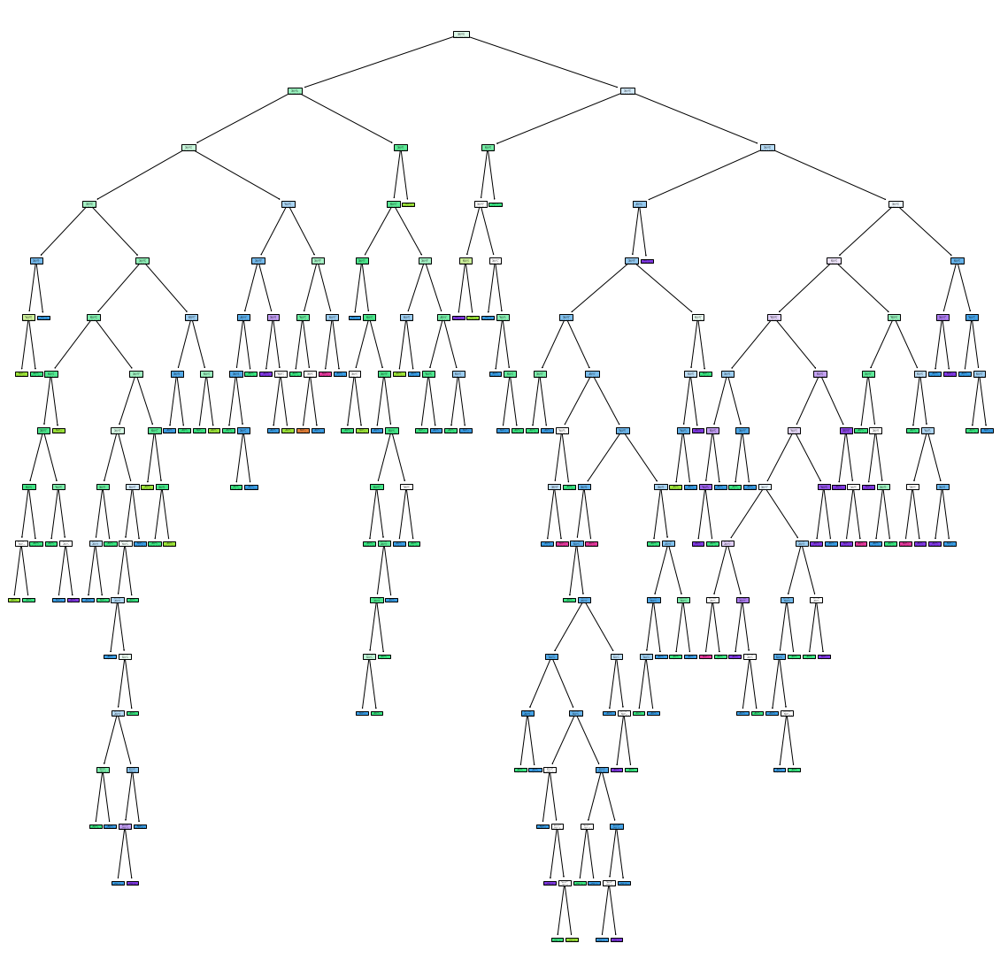

In [50]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True)

In [51]:
set(y1) 

# these are the different quality of wines(classes) present in first 500 records that we have selected

{3, 4, 5, 6, 7, 8}

[Text(513.7688905810684, 1055.2235294117647, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(325.67432052483593, 991.2705882352941, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(205.7853795688847, 927.3176470588236, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(93.61012183692596, 863.364705882353, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(33.46954076850984, 799.4117647058824, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(25.10215557638238, 735.4588235294118, 'X[7] <= 0.998\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(16.73477038425492, 671.5058823529412, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(33.46954076850984, 671.5058823529412, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nc

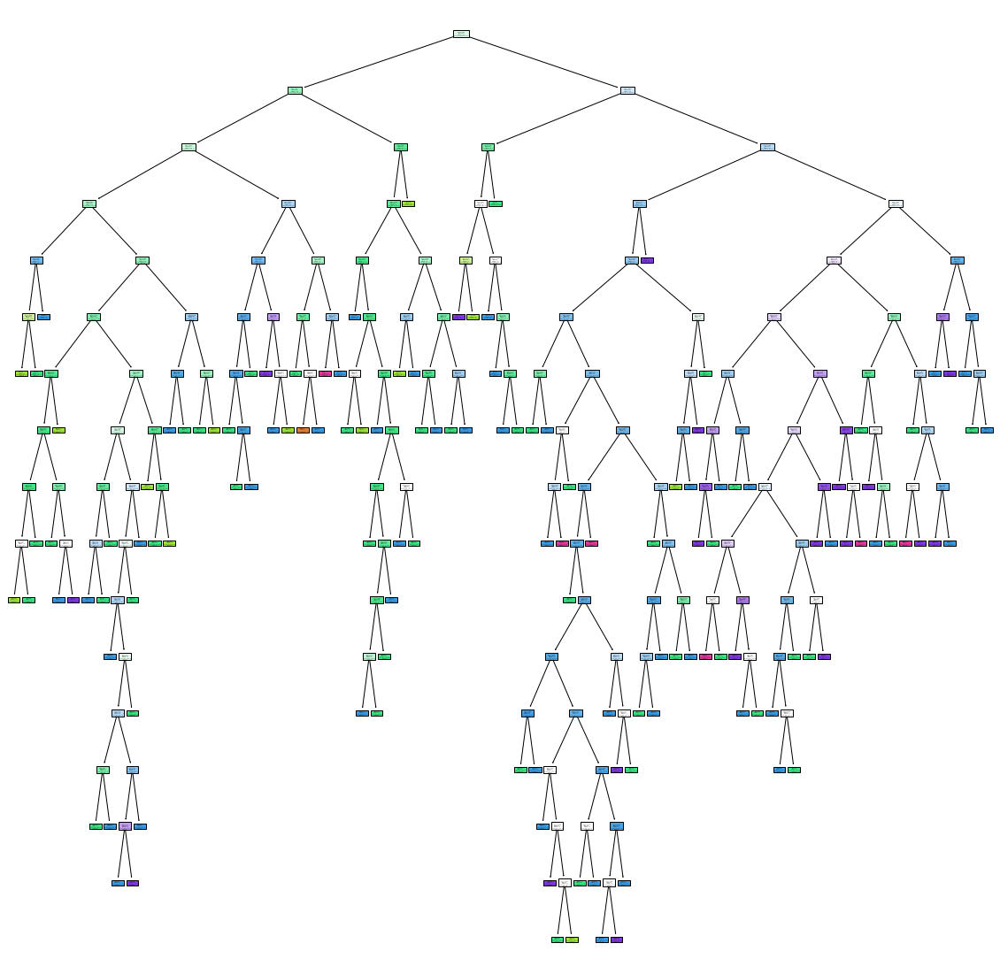

In [52]:
# Trying to see class_names in the tree

class_list_str = [str(i) for i in set(y1)]
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names= class_list_str)

In [53]:
# trying to save this tree
plt.savefig('dt_model_1')

<Figure size 432x288 with 0 Axes>

In [54]:
dt_model1.score(x1,y1)

1.0

In [55]:
dt_model1.score(x_test,y_test)

0.6203125

In [56]:
path = dt_model1.cost_complexity_pruning_path(x1,y1) # argument is given that data which was our training data
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00203333, 0.00261111, 0.00262769,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00271329, 0.00272222,
        0.00283333, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00328205, 0.00333333,
        0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
        0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373333,
        0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
        0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
        0.0048    , 0.00495726, 0.00504242, 0.00508235, 0.00509091,
        0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
        0.00671079, 0.0067591 , 0.

In [57]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path["ccp_alphas"]# extracting ccp_alphas from the dictionary output of the path
ccp_alpha = path.ccp_alphas # 2nd method

In [58]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.00203333,
       0.00261111, 0.00262769, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00271329, 0.00272222, 0.00285714, 0.003     , 0.003     ,
       0.003     , 0.003     , 0.00304762, 0.00305051, 0.00308418,
       0.00325   , 0.00328205, 0.00333333, 0.00333333, 0.00334032,
       0.00336606, 0.00342857, 0.00343316, 0.0035    , 0.0035    ,
       0.0036    , 0.00363636, 0.00373809, 0.0038    , 0.0038237 ,
       0.004     , 0.00404444, 0.00428571, 0.00428571, 0.00437662,
       0.00462338, 0.00465709, 0.00466667, 0.0048    , 0.00487179,
       0.00504242, 0.00508235, 0.00509091, 0.00510606, 0.00516667,
       0.00568485, 0.00589394, 0.00656364, 0.00671079, 0.00675

In [59]:
dt_model2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [60]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 Decis

In [61]:
[model.score(x1,y1) for model in dt_model2]

[1.0,
 1.0,
 0.998,
 0.996,
 0.992,
 0.988,
 0.986,
 0.986,
 0.962,
 0.964,
 0.96,
 0.96,
 0.962,
 0.96,
 0.962,
 0.962,
 0.962,
 0.964,
 0.964,
 0.962,
 0.952,
 0.946,
 0.934,
 0.926,
 0.932,
 0.93,
 0.932,
 0.93,
 0.932,
 0.932,
 0.928,
 0.928,
 0.92,
 0.916,
 0.914,
 0.916,
 0.918,
 0.91,
 0.912,
 0.91,
 0.908,
 0.9,
 0.896,
 0.9,
 0.894,
 0.898,
 0.89,
 0.884,
 0.88,
 0.886,
 0.884,
 0.878,
 0.87,
 0.872,
 0.858,
 0.854,
 0.858,
 0.858,
 0.846,
 0.842,
 0.848,
 0.834,
 0.828,
 0.814,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [62]:
train_score = [model.score(x1,y1) for model in dt_model2]

In [63]:
test_score = [model.score(x_test,y_test) for model in dt_model2]
test_score

[0.5953125,
 0.584375,
 0.60625,
 0.6265625,
 0.6,
 0.6046875,
 0.6046875,
 0.6171875,
 0.5890625,
 0.5984375,
 0.5859375,
 0.6015625,
 0.590625,
 0.5953125,
 0.5734375,
 0.5890625,
 0.5859375,
 0.60625,
 0.603125,
 0.59375,
 0.6140625,
 0.6015625,
 0.60625,
 0.5875,
 0.58125,
 0.590625,
 0.6,
 0.5921875,
 0.59375,
 0.6015625,
 0.584375,
 0.6046875,
 0.6046875,
 0.5953125,
 0.603125,
 0.60625,
 0.571875,
 0.5921875,
 0.5875,
 0.5875,
 0.5796875,
 0.5921875,
 0.609375,
 0.5921875,
 0.59375,
 0.5875,
 0.609375,
 0.60625,
 0.6140625,
 0.5953125,
 0.5984375,
 0.5875,
 0.5953125,
 0.5984375,
 0.603125,
 0.5875,
 0.596875,
 0.5921875,
 0.6,
 0.6,
 0.5953125,
 0.596875,
 0.6046875,
 0.6,
 0.60625,
 0.6046875,
 0.609375,
 0.584375,
 0.5875,
 0.5875,
 0.58125,
 0.5890625,
 0.584375,
 0.5890625,
 0.58125,
 0.584375,
 0.5890625,
 0.5828125,
 0.584375,
 0.5765625,
 0.5859375,
 0.578125,
 0.5828125,
 0.571875,
 0.5671875,
 0.5671875,
 0.5703125,
 0.5734375,
 0.5734375,
 0.5734375,
 0.565625,
 0.428

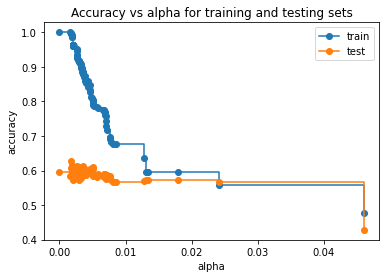

In [64]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [65]:
# we are trying to perform hyper parameter tuning in a manual way
# next we will try to perform the same with libraries Random Search CV or Grid Search CV
# we can observe that when ccp alpha values in betweern 0.01 to 0.02 or beyond that, 
#our model accuracy on training and testing dataset is almost similar.
# therefore, we need to rebuild the model

In [66]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014) # any value between 0.01 and 0.02

In [67]:
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

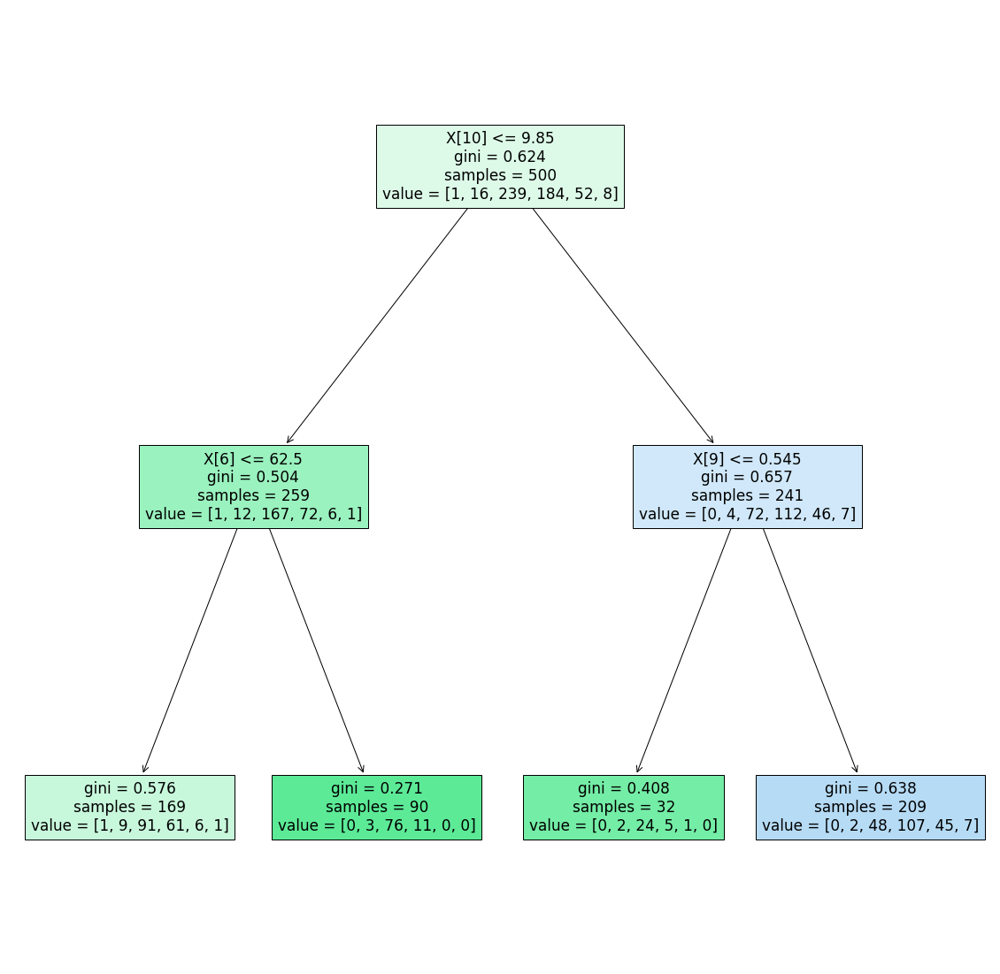

In [68]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled= True)

In [69]:
dt_model_ccp.score(x1,y1)

0.596

In [70]:
dt_model_ccp.score(x_test, y_test)

0.5734375

In [71]:
# which parameter is going to build the best possible tree

grid_param = {
    "criterion" : ['gini', 'entropy'],
    "splitter" : ['best', 'random'],
    "max_depth" : range(2,40,1),
    "min_samples_split" : range(2,10,1),
    "min_samples_leaf" : range(1,10,1)
}

In [72]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_param,cv= 5,n_jobs = -1)
#n_jobs = -1 means engage all the processors, bcoz it is going to be a complete heavy computation

In [73]:
grid_ccp.fit(x1,y1)

C:\Users\Utkarsh\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [74]:
# now let us find out the best possible parameters:

grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [75]:
# now let us try to retrain our model based on these parameters
#let us create a new decision tree
dt_ccp_new = DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf=2, min_samples_split=2,splitter='random')

In [76]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [77]:
dt_ccp_new.score(x1,y1) #training accuracy

0.88

In [78]:
dt_ccp_new.score(x_test,y_test)

0.58125

In [79]:
# even after doing hyperparameter tuning, we are getting over fitted model
# Therefore we can't say that hyperparameter tuning guarantees the best possible model.
dt_ccp_new = DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf=2, min_samples_split=2,splitter='random', ccp_alpha=0.014)

In [80]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [81]:
dt_ccp_new.score(x1,y1)

0.66

In [82]:
dt_ccp_new.score(x_test, y_test)

0.546875

#some closer wrt to the previous one

In [83]:
dt_ccp_new = DecisionTreeClassifier(criterion='entropy',max_depth=17,min_samples_leaf=1, min_samples_split=3,splitter='random', ccp_alpha=0.014)

In [84]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [85]:
dt_ccp_new.score(x1,y1)

0.668

In [86]:
dt_ccp_new.score(x_test, y_test)

0.5578125

In [87]:
# a little bit closer 

In [89]:
#let us try to find out confusionmatrices:

In [90]:
dt_ccp_new.predict(x_train)

array([5, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 8, 5, 5, 5, 5, 5,
       6, 6, 5, 5, 5, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5,
       6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 5, 5, 5, 5,
       6, 5, 6, 5, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6, 6, 6,
       5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 4, 6, 6,
       5, 8, 6, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 7,
       6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 6, 6, 5, 6, 5, 6, 5,
       6, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6, 5, 5, 6, 6, 6, 5, 4, 6, 6, 5, 5,
       6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6, 5, 5, 5, 6, 6, 6,
       5, 5, 6, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 6, 6, 5, 5, 6, 5, 5, 6,
       6, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 4, 5, 5, 6, 5, 5, 6,
       6, 5, 5, 5, 6, 6, 6, 5, 6, 5, 6, 5, 5, 5, 5,

In [91]:
pred = dt_ccp_new.predict(x_train)

In [92]:
confusion_matrix(y_train,pred) #try to analyse this confusion matrix and explain it in next class

array([[  0,   0,   3,   4,   0,   0],
       [  0,   4,  18,   8,   0,   0],
       [  0,   5, 273, 127,   2,   0],
       [  0,   2, 127, 262,   1,   0],
       [  0,   1,   7,  92,  10,   1],
       [  0,   0,   1,   9,   0,   2]], dtype=int64)